In [1]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
df_edges= pd.read_excel('C:/Users/Pratyush Rohilla/Downloads/Social media analytics project/SoNAR_Edges.xlsx') 
df_nodes = pd.read_excel('C:/Users/Pratyush Rohilla/Downloads/Social media analytics project/SoNAR_Nodes.xlsx')
df_pirus = pd.read_excel('C:/Users/Pratyush Rohilla/Downloads/Social media analytics project/PIRUS V5.xlsx')

In [3]:
df_edges

,Source,Target
0,8561,10007
1,10007,10008
2,8561,10008
3,10007,10009
4,10008,10009
...,...,...
15648,12779,NaN
15649,12780,NaN
15650,12781,NaN
15651,12783,NaN


In [4]:
df_edges = df_edges.dropna()
df_edges

,Source,Target
0,8561,10007
1,10007,10008
2,8561,10008
3,10007,10009
4,10008,10009
...,...,...
14350,10633,10634
14351,10633,10503
14352,10634,10503
14353,10610,12788


In [5]:
# Ensure the dataset has correct column names (Subject_A, Subject_B)
if 'Source' not in df_edges.columns or 'Target' not in df_edges.columns:
    raise ValueError("Error: Ensure the dataset has 'Source' and 'Target' columns.")

# Create a directed graph (social network)
G = nx.DiGraph()

df_edges["Source"] = df_edges["Source"].astype(str)
df_edges["Target"] = df_edges["Target"].astype(str)

# Add edges (connections between users)
for _, row in df_edges.iterrows():
    G.add_edge(row['Source'], row['Target'])

print(f"Graph Created with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

# **1️⃣ Compute Network Centrality Metrics**
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
try:
    # **Fix: Increase Iterations & Add nstart**
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000, tol=1e-6, nstart={n: 1 for n in G})
except nx.PowerIterationFailedConvergence:
    print("Eigenvector centrality did not converge. Switching to PageRank instead.")
    eigenvector_centrality = nx.pagerank(G, alpha=0.85)



C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_8108\1000798148.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_edges["Source"] = df_edges["Source"].astype(str)
C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_8108\1000798148.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_edges["Target"] = df_edges["Target"].astype(str)


Graph Created with 4088 nodes and 14355 edges.


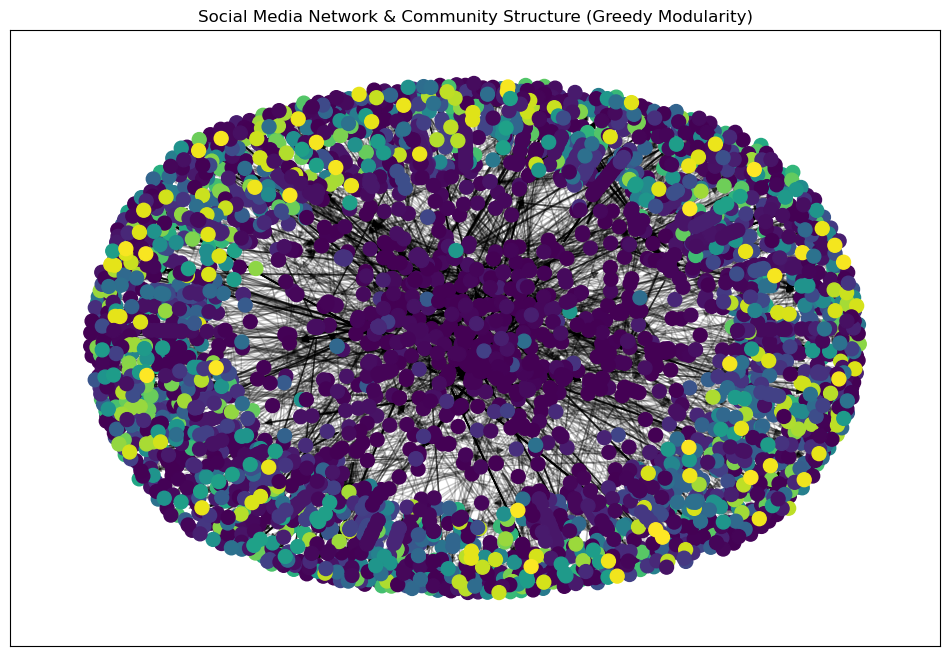

Centrality measures saved to 'social_network_centrality.csv'.
Top 10 Influential Users by Degree Centrality:
       User  Degree Centrality  Betweenness Centrality  \
1909   4523           0.017372                0.000157   
653    4522           0.017372                0.000303   
1912   4527           0.015659                0.000026   
1910   4524           0.014681                0.000061   
1854   4531           0.014681                0.000213   
1911   4526           0.014436                0.000019   
2007   4699           0.013702                0.000000   
1860   4850           0.013457                0.000853   
508   10816           0.013457                0.000011   
1851   4512           0.013213                0.000254   

      Eigenvector Centrality  Community  
1909            1.943310e-17          2  
653             1.619879e-17          2  
1912            3.313855e-17          2  
1910            2.318752e-17          2  
1854            3.370445e-17          2  


In [6]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from networkx.algorithms.community import greedy_modularity_communities

# Assume these centrality dictionaries have been computed earlier:
# degree_centrality, betweenness_centrality, eigenvector_centrality

# -------------------------------
# Step 1: Store Centrality Measures in a DataFrame
# -------------------------------
centrality_df = pd.DataFrame({
    "User": list(degree_centrality.keys()),
    "Degree Centrality": list(degree_centrality.values()),
    "Betweenness Centrality": list(betweenness_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values())
})

# -------------------------------
# Step 2: Detect Communities Using Greedy Modularity Optimization
# -------------------------------
communities = list(greedy_modularity_communities(G))
# Create a mapping from each node to its community index
community_map = {user: idx for idx, comm in enumerate(communities) for user in comm}

# Add the community assignment to the centrality DataFrame
centrality_df["Community"] = centrality_df["User"].map(community_map)

# -------------------------------
# Step 3: Visualization of the Social Network with Greedy Communities
# -------------------------------
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
node_colors = [community_map.get(node, 0) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=100, cmap=plt.cm.viridis, node_color=node_colors)
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.title("Social Media Network & Community Structure (Greedy Modularity)")
plt.show()

# -------------------------------
# Step 4: Save Results and Display Top Influential Users
# -------------------------------
centrality_df.to_csv("social_network_centrality.csv", index=False)
print("Centrality measures saved to 'social_network_centrality.csv'.")

print("Top 10 Influential Users by Degree Centrality:")
print(centrality_df.sort_values(by="Degree Centrality", ascending=False).head(10))


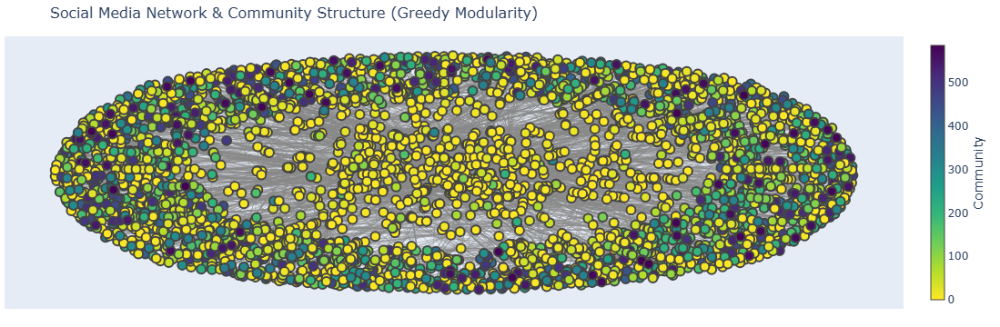

In [7]:
import networkx as nx
import plotly.graph_objs as go
import plotly.io as pio
from networkx.algorithms.community import greedy_modularity_communities

# Assume your graph G is already defined

# -------------------------------
# Step 1: Compute Communities Using Greedy Modularity
# -------------------------------
communities = list(greedy_modularity_communities(G))
community_map = {node: idx for idx, comm in enumerate(communities) for node in comm}

# -------------------------------
# Step 2: Compute Node Positions Using Spring Layout
# -------------------------------
pos = nx.spring_layout(G, seed=42)

# -------------------------------
# Step 3: Build Edge Trace for Plotly
# -------------------------------
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

# -------------------------------
# Step 4: Build Node Trace for Plotly (Color-Coded by Community)
# -------------------------------
node_x = []
node_y = []
node_color = []
node_text = []

for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    # Use the greedy modularity community mapping to set node color; default to 0 if missing.
    community = community_map.get(node, 0)
    node_color.append(community)
    node_text.append(f"User: {node}<br>Community: {community}")

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        reversescale=True,
        color=node_color,
        size=10,
        colorbar=dict(
            thickness=15,
            title='Community',
            xanchor='left',
            titleside='right'
        ),
        line_width=2
    ),
    text=node_text
)

# -------------------------------
# Step 5: Create the Plotly Figure and Display It
# -------------------------------
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Social Media Network & Community Structure (Greedy Modularity)',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))
fig.show()


Largest community size: 323 nodes


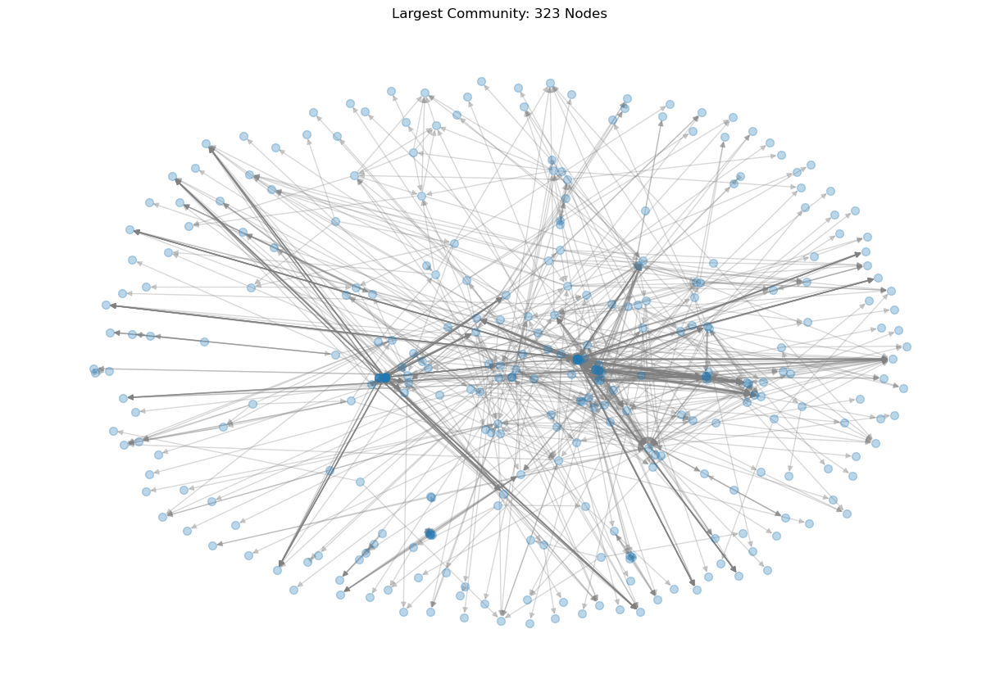

In [8]:
## BETTER GRAPH BELOW

from networkx.algorithms.community import greedy_modularity_communities

# Compute communities using greedy modularity
communities = list(greedy_modularity_communities(G))
# Select the largest community (by node count)
largest_community = max(communities, key=len)
# Create a subgraph containing only the nodes of the largest community
G_subgraph = G.subgraph(largest_community)

print(f"Largest community size: {len(G_subgraph.nodes)} nodes")

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_subgraph, seed=42)
nx.draw(G_subgraph, pos, node_size=50, edge_color="gray", alpha=0.3, with_labels=False)
plt.title(f"Largest Community: {len(G_subgraph.nodes)} Nodes")
plt.show()


2-Core Bidirectional Network: 240 nodes, 1239 edges


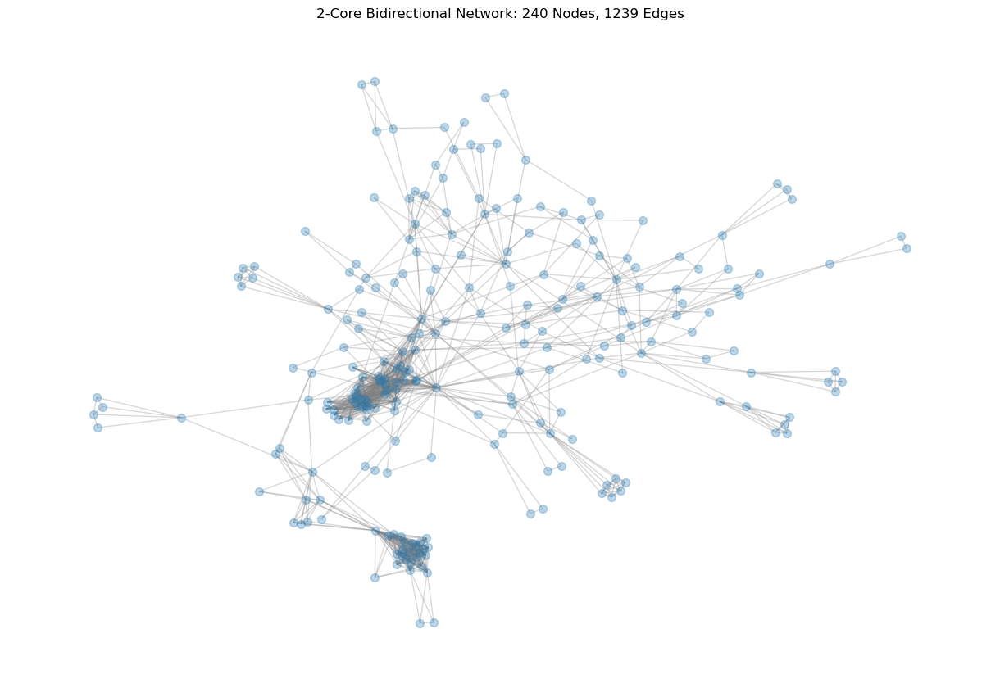

In [9]:
## BETTER GRAPH BELOW

# Convert the largest community subgraph to an undirected graph for bidirectional analysis
G_undirected = G_subgraph.to_undirected()

# Compute the 2-core of the undirected largest community subgraph
G_2core_bidirectional = nx.k_core(G_undirected, k=2)

# Get the number of nodes and edges in the 2-core bidirectional network
num_nodes_2core_bi = G_2core_bidirectional.number_of_nodes()
num_edges_2core_bi = G_2core_bidirectional.number_of_edges()

print(f"2-Core Bidirectional Network: {num_nodes_2core_bi} nodes, {num_edges_2core_bi} edges")

# Visualize the 2-core bidirectional network
plt.figure(figsize=(12, 8))
pos_2core_bi = nx.spring_layout(G_2core_bidirectional, seed=42)
nx.draw(G_2core_bidirectional, pos_2core_bi, node_size=50, edge_color="gray", alpha=0.3, with_labels=False)
plt.title(f"2-Core Bidirectional Network: {num_nodes_2core_bi} Nodes, {num_edges_2core_bi} Edges")
plt.show()

In [10]:
import networkx as nx
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# **1️⃣ Network Summary Statistics**
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)

# **Community Analysis Using Greedy Modularity**
communities = list(greedy_modularity_communities(G))
num_communities = len(communities)
largest_community = max(communities, key=len)
largest_community_size = len(largest_community)

# **Degree Distribution**
degree_values = [deg for _, deg in G.degree()]
avg_degree = sum(degree_values) / num_nodes
max_degree = max(degree_values)

# **Network Summary Output**
network_summary = pd.DataFrame({
    "Metric": [
        "Total Nodes", "Total Edges", "Network Density",
        "Number of Communities", "Largest Community Size",
        "Average Node Degree", "Max Node Degree"
    ],
    "Value": [
        num_nodes, num_edges, density,
        num_communities, largest_community_size,
        avg_degree, max_degree
    ]
})

print("Network Summary:")
print(network_summary)


Network Summary:
                   Metric         Value
0             Total Nodes   4088.000000
1             Total Edges  14355.000000
2         Network Density      0.000859
3   Number of Communities    587.000000
4  Largest Community Size    323.000000
5     Average Node Degree      7.022994
6         Max Node Degree     71.000000


Largest community size: 323 nodes


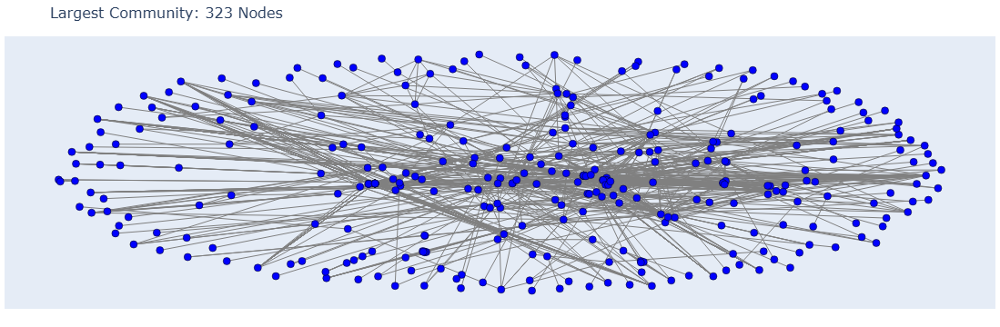

In [11]:
import networkx as nx
import plotly.graph_objs as go
from networkx.algorithms.community import greedy_modularity_communities

# Compute communities using greedy modularity
communities = list(greedy_modularity_communities(G))
# Select the largest community (by node count)
largest_community = max(communities, key=len)
# Create a subgraph for the largest community
G_subgraph = G.subgraph(largest_community)
print(f"Largest community size: {len(G_subgraph.nodes)} nodes")

# Compute positions for nodes using a spring layout
pos = nx.spring_layout(G_subgraph, seed=42)

# Build the edge trace
edge_x = []
edge_y = []
for edge in G_subgraph.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(width=1, color='gray'),
    hoverinfo='none',
    mode='lines'
)

# Build the node trace
node_x = []
node_y = []
node_text = []
for node in G_subgraph.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(f"Node: {node}")

node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=8,
        color='blue',
        line=dict(width=0.5, color='black')
    ),
    text=node_text
)

# Create and display the Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title=f'Largest Community: {len(G_subgraph.nodes)} Nodes',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))
fig.show()


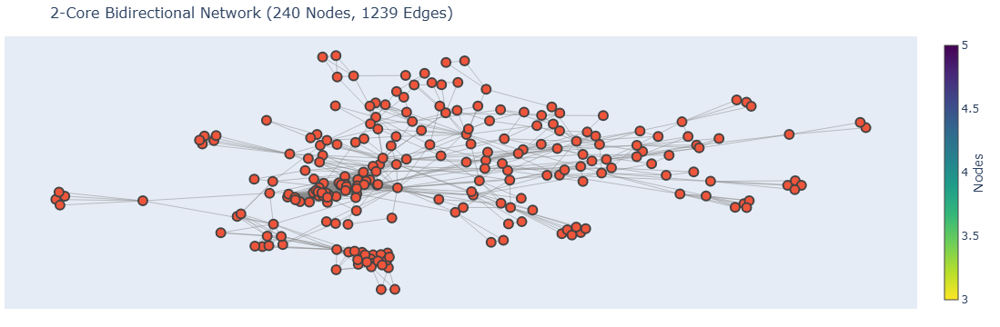

In [12]:
# Convert the largest community subgraph to an undirected graph for bidirectional analysis
G_undirected = G_subgraph.to_undirected()

# Compute the 2-core of the undirected largest community subgraph
G_2core_bidirectional = nx.k_core(G_undirected, k=2)

# Get node positions
pos_2core_bi = nx.spring_layout(G_2core_bidirectional, seed=42)

# Extract edges
edge_x = []
edge_y = []
for edge in G_2core_bidirectional.edges():
    x0, y0 = pos_2core_bi[edge[0]]
    x1, y1 = pos_2core_bi[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

# Extract nodes
node_x = []
node_y = []
node_text = []

for node in G_2core_bidirectional.nodes():
    x, y = pos_2core_bi[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(f"User: {node}")

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        reversescale=True,
        size=10,
        colorbar=dict(
            thickness=15,
            title='Nodes',
            xanchor='left',
            titleside='right'
        ),
        line_width=2
    ),
    text=node_text
)

# Create the Plotly Figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title=f'2-Core Bidirectional Network ({G_2core_bidirectional.number_of_nodes()} Nodes, {G_2core_bidirectional.number_of_edges()} Edges)',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))

# Show the interactive Plotly graph
fig.show()

       User  Degree Centrality  Betweenness Centrality  \
1909   4523           0.017372                0.000157   
653    4522           0.017372                0.000303   
1912   4527           0.015659                0.000026   
1910   4524           0.014681                0.000061   
1854   4531           0.014681                0.000213   
1911   4526           0.014436                0.000019   
2007   4699           0.013702                0.000000   
1860   4850           0.013457                0.000853   
508   10816           0.013457                0.000011   
1851   4512           0.013213                0.000254   

      Eigenvector Centrality  Community  
1909            1.943310e-17          2  
653             1.619879e-17          2  
1912            3.313855e-17          2  
1910            2.318752e-17          2  
1854            3.370445e-17          2  
1911            2.879583e-17          2  
2007            4.401891e-17          2  
1860            3.331209e

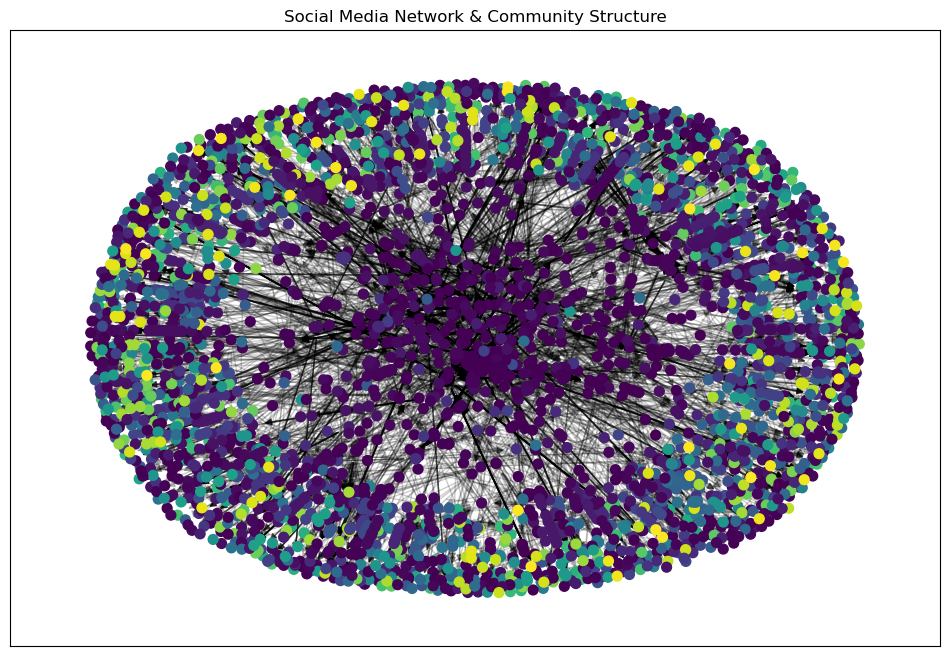

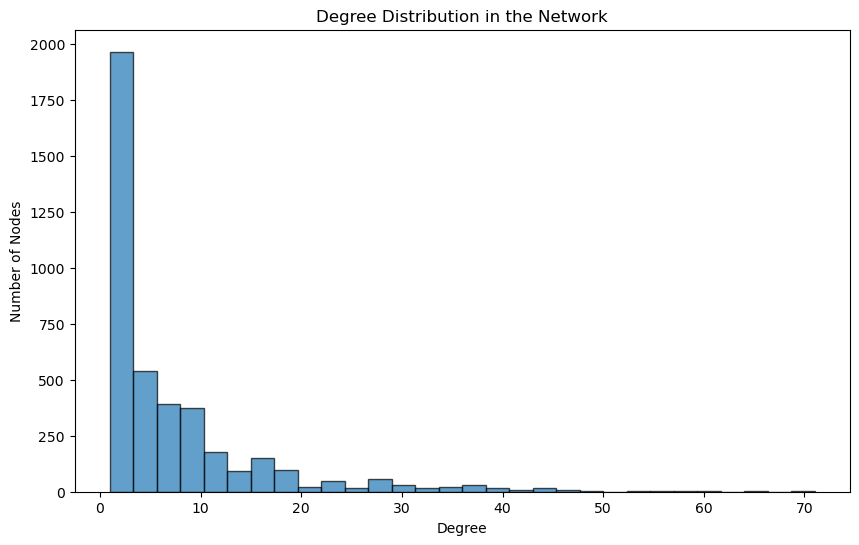

                              Metric  Count
0    Isolated Nodes (No Connections)      0
1  Users with Zero Degree Centrality      0
All network analysis results have been saved into 'social_network_analysis.csv'.


In [13]:
# **2️⃣ Centrality Analysis**
# Identify top influential users based on different centrality measures
top_degree = centrality_df.sort_values(by="Degree Centrality", ascending=False).head(10)
top_betweenness = centrality_df.sort_values(by="Betweenness Centrality", ascending=False).head(10)
top_eigenvector = centrality_df.sort_values(by="Eigenvector Centrality", ascending=False).head(10)

print(top_degree)
print(top_betweenness)
print(top_eigenvector)


# **3️⃣ Community Structure Analysis**
num_communities = centrality_df["Community"].nunique()

# Find the top communities with the most members
top_communities = centrality_df["Community"].value_counts().head(10).reset_index()
top_communities.columns = ["Community", "Size"]

print(top_communities)
# **4️⃣ Network Visualization - Community Highlighting**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.viridis, 
                       node_color=[centrality_df.set_index("User")["Community"].to_dict().get(str(node), 0) for node in G.nodes()])
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.title("Social Media Network & Community Structure")
plt.show()

# **5️⃣ Degree Distribution Plot**
plt.figure(figsize=(10, 6))
plt.hist(degree_values, bins=30, edgecolor='black', alpha=0.7)
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.title("Degree Distribution in the Network")
plt.show()

# **6️⃣ Identifying Isolated Users**
isolated_nodes = list(nx.isolates(G))
num_isolated = len(isolated_nodes)

# **Check for users with no influence (Degree = 0)**
low_influence_users = centrality_df[centrality_df["Degree Centrality"] == 0]

# Display isolated users count
isolated_summary = pd.DataFrame({
    "Metric": ["Isolated Nodes (No Connections)", "Users with Zero Degree Centrality"],
    "Count": [num_isolated, len(low_influence_users)]
})
print(isolated_summary)

# Combine all data into a single CSV file with multiple sections
with open("social_network_analysis.csv", "w") as file:
    # Write Network Summary
    file.write("Network Summary\n")
    network_summary.to_csv(file, index=False)
    file.write("\n")  # Add spacing

    # Write Top Influential Users - Degree Centrality
    file.write("Top Influential Users by Degree Centrality\n")
    top_degree.to_csv(file, index=False)
    file.write("\n")

    # Write Top Influential Users - Betweenness Centrality
    file.write("Top Influential Users by Betweenness Centrality\n")
    top_betweenness.to_csv(file, index=False)
    file.write("\n")

    # Write Top Influential Users - Eigenvector Centrality
    file.write("Top Influential Users by Eigenvector Centrality\n")
    top_eigenvector.to_csv(file, index=False)
    file.write("\n")

    # Write Community Structure
    file.write("Top 10 Largest Communities\n")
    top_communities.to_csv(file, index=False)
    file.write("\n")

    # Write Isolated Users Summary
    file.write("Isolated Users Summary\n")
    isolated_summary.to_csv(file, index=False)

# Confirm that the file is saved
print("All network analysis results have been saved into 'social_network_analysis.csv'.")


# # If we remove key individuals (high betweenness nodes), does the network collapse? 
---

Removing 367 high-betweenness nodes...
Before Removal: 587 communities, Largest community: 323 nodes.
After Removal: 915 communities, Largest community: 95 nodes.


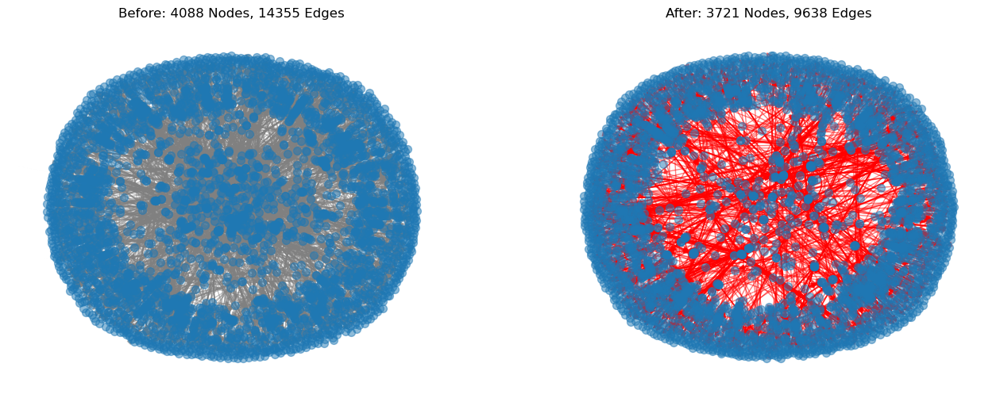

Network Collapse Analysis:
                   Metric  Before Removal  After Removal
0             Total Nodes            4088           3721
1             Total Edges           14355           9638
2   Number of Communities             587            915
3  Largest Community Size             323             95
Results saved to 'network_collapse_analysis.csv'


In [15]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# **Step 1: Identify High-Betweenness Nodes**
# Sort nodes by betweenness centrality (assumes centrality_df exists)
sorted_nodes = centrality_df.sort_values(by="Betweenness Centrality", ascending=False)["User"].tolist()

# Select top 5% highest betweenness nodes (here set to 467 nodes)
num_to_remove = int(367)  # Adjustable number
high_betweenness_nodes = sorted_nodes[:num_to_remove]

print(f"Removing {num_to_remove} high-betweenness nodes...")

# **Step 2: Analyze Network Before Removal using Greedy Modularity Communities**
communities_before = list(greedy_modularity_communities(G))
num_communities_before = len(communities_before)
largest_community_before = max(communities_before, key=len)
largest_community_size_before = len(largest_community_before)

print(f"Before Removal: {num_communities_before} communities, Largest community: {largest_community_size_before} nodes.")

# **Step 3: Remove High Betweenness Nodes**
G_modified = G.copy()
G_modified.remove_nodes_from(high_betweenness_nodes)

# **Step 4: Analyze Network After Removal using Greedy Modularity Communities**
communities_after = list(greedy_modularity_communities(G_modified))
num_communities_after = len(communities_after)
largest_community_after = max(communities_after, key=len)
largest_community_size_after = len(largest_community_after)

print(f"After Removal: {num_communities_after} communities, Largest community: {largest_community_size_after} nodes.")

# **Step 5: Visualization Before vs. After**
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Visualization Before Removal
ax = axes[0]
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"Before: {G.number_of_nodes()} Nodes, {G.number_of_edges()} Edges")

# Visualization After Removal
ax = axes[1]
pos = nx.spring_layout(G_modified, seed=42)
nx.draw(G_modified, pos, node_size=50, edge_color="red", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"After: {G_modified.number_of_nodes()} Nodes, {G_modified.number_of_edges()} Edges")

plt.show()

# **Step 6: Summary Output**
collapse_summary = pd.DataFrame({
    "Metric": ["Total Nodes", "Total Edges", "Number of Communities", "Largest Community Size"],
    "Before Removal": [G.number_of_nodes(), G.number_of_edges(), num_communities_before, largest_community_size_before],
    "After Removal": [G_modified.number_of_nodes(), G_modified.number_of_edges(), num_communities_after, largest_community_size_after]
})

print("Network Collapse Analysis:")
print(collapse_summary)

# **Step 7: Save Results**
collapse_summary.to_csv("network_collapse_analysis.csv", index=False)
print("Results saved to 'network_collapse_analysis.csv'")


#### communities are based on different kind of plots, which means that there can be many people within the community who has who have different kind of ideologies as well as diff kind and number of plots they have worked in. we can't even divide the community on the chest basis of between scores. Since these are highly dense clusters we also need to take care. The metric of high degree metric to break these community now look into other ways of breaking the commmunities

 Key Insights
1️⃣ High-Betweenness Nodes Were Critical Bridges

The large drop in edges (4,717 lost) confirms that these nodes were highly connected individuals, serving as links between groups.
Their removal drastically reduced communication pathways, making the network less cohesive.
2️⃣ The Network Becomes Highly Fragmented

The number of communities increased from 587 to 915 → A sign that the network split into smaller, disconnected clusters.
This suggests that many individuals lost their direct connections to the broader extremist network.
3️⃣ The Largest Community Lost 71% of Its Nodes

The largest connected extremist faction shrank from 323 to 95 nodes.
This means the removal of high-betweenness individuals broke up key power centers, forcing the network into smaller, less effective units.
💡 Real-World Implications
✅ Disrupting extremist networks: Removing key individuals severely weakens communication and collaboration, making radicalization and coordination harder.
✅ Preventing large-scale coordination: With fewer direct bridges, it becomes harder for groups to share resources, plan attacks, or recruit new members.
✅ Slowing down ideological spread: The fragmentation ensures that ideas don’t spread as easily, reducing the overall reach and influence of extremist groups.

# What happens if we remove both high-betweenness and high-degree nodes?
---

### Multi-Node Attack: Remove Both High Degree & Betweenness Nodes

Removing 367 high-influence nodes (Betweenness + Degree)...
Before Removal: 587 communities, Largest community: 323 nodes.
After Multi-Node Removal: 849 communities, Largest community: 119 nodes.


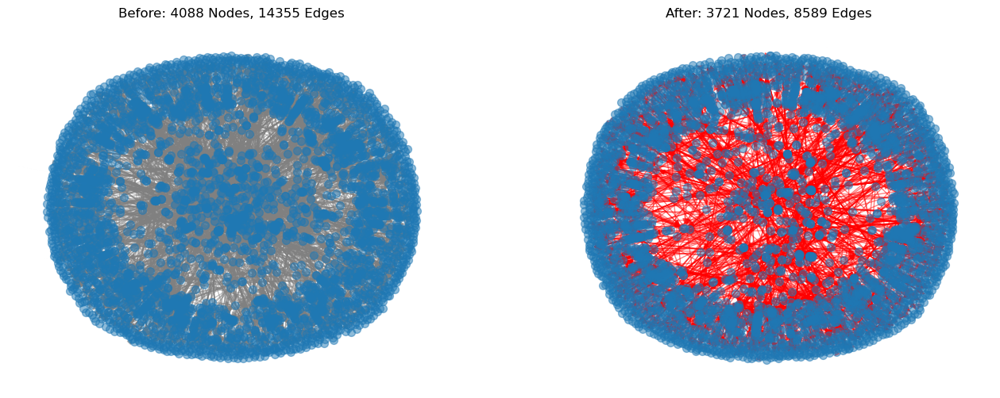

Network Collapse Analysis:
                   Metric  Before Removal  After Removal
0             Total Nodes            4088           3721
1             Total Edges           14355           8589
2   Number of Communities             587            849
3  Largest Community Size             323            119
Results saved to 'multi_node_collapse_analysis.csv'


In [20]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# -------------------------------
# Step 1: Identify Top High-Influence Nodes (Betweenness + Degree)
# -------------------------------
top_5_percent = int(0.05 * len(G))  # 5% of the network

# Get top 5% nodes for betweenness
top_betweenness_nodes = centrality_df.sort_values(by="Betweenness Centrality", ascending=False)["User"].tolist()[:top_5_percent]

# Get top 5% nodes for degree centrality
top_degree_nodes = centrality_df.sort_values(by="Degree Centrality", ascending=False)["User"].tolist()[:top_5_percent]

# Combine both lists and remove duplicates
nodes_to_remove = list(set(top_betweenness_nodes + top_degree_nodes))

print(f"Removing {len(nodes_to_remove)} high-influence nodes (Betweenness + Degree)...")

# -------------------------------
# Step 2: Analyze Network Before Removal using Greedy Modularity Communities
# -------------------------------
communities_before = list(greedy_modularity_communities(G))
num_communities_before = len(communities_before)
largest_community_before = max(communities_before, key=len)
largest_community_size_before = len(largest_community_before)

print(f"Before Removal: {num_communities_before} communities, Largest community: {largest_community_size_before} nodes.")

# -------------------------------
# Step 3: Remove High-Influence Nodes
# -------------------------------
G_multi_removed = G.copy()
G_multi_removed.remove_nodes_from(nodes_to_remove)

# -------------------------------
# Step 4: Analyze Network After Multi-Node Removal using Greedy Modularity Communities
# -------------------------------
communities_after = list(greedy_modularity_communities(G_multi_removed))
num_communities_after = len(communities_after)
largest_community_after = max(communities_after, key=len)
largest_community_size_after = len(largest_community_after)

print(f"After Multi-Node Removal: {num_communities_after} communities, Largest community: {largest_community_size_after} nodes.")

# -------------------------------
# Step 5: Visualization Before vs. After (Using Spring Layout)
# -------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Before Removal Visualization
ax = axes[0]
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"Before: {G.number_of_nodes()} Nodes, {G.number_of_edges()} Edges")

# After Removal Visualization
ax = axes[1]
pos = nx.spring_layout(G_multi_removed, seed=42)
nx.draw(G_multi_removed, pos, node_size=50, edge_color="red", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"After: {G_multi_removed.number_of_nodes()} Nodes, {G_multi_removed.number_of_edges()} Edges")

plt.show()

# -------------------------------
# Step 6: Summary Output
# -------------------------------
multi_node_collapse_summary = pd.DataFrame({
    "Metric": ["Total Nodes", "Total Edges", "Number of Communities", "Largest Community Size"],
    "Before Removal": [G.number_of_nodes(), G.number_of_edges(), num_communities_before, largest_community_size_before],
    "After Removal": [G_multi_removed.number_of_nodes(), G_multi_removed.number_of_edges(), num_communities_after, largest_community_size_after]
})

print("Network Collapse Analysis:")
print(multi_node_collapse_summary)

# -------------------------------
# Step 7: Save Results
# -------------------------------
multi_node_collapse_summary.to_csv("multi_node_collapse_analysis.csv", index=False)
print("Results saved to 'multi_node_collapse_analysis.csv'")


Key Insights
1️⃣ The Network Shrinks More, But Stays More Connected

More edges are lost (5,766 vs. 4,717 in the previous analysis), meaning that removing high-degree nodes eliminated many direct connections.
However, fewer new communities are formed (849 vs. 915), which means that removing high-degree nodes prevented extreme fragmentation by eliminating highly clustered groups.
2️⃣ Largest Community Shrinks Less Than Before

The largest community remains slightly larger (119 nodes) compared to just betweenness removal (95 nodes).
This suggests that some small disconnected groups merged back into the remaining structure, making it more resilient in some ways.
3️⃣ More Structural Weakening, But Less Fragmentation

The network is now less connected overall (fewer edges), but it is less fragmented than before.
This happens because high-degree nodes often have many redundant links, so removing them doesn't isolate as many small groups as removing just high-betweenness nodes.

## Combined Insight

 Why is the Largest Community Bigger When Removing More Nodes?
Even though both analyses remove 367 nodes, the structure of the remaining nodes changes based on who was removed.

🔹 Removing Only High-Betweenness Nodes (First Case)

The network fragments quickly because key "bridges" between communities disappear.
Many small communities emerge as individuals lose their interconnections.
The largest community loses key links, leading to a smaller size (95 nodes).
🔹 Removing Both High-Betweenness and High-Degree Nodes (Second Case)

Some high-degree nodes may have been holding fragmented groups together.
By removing them, some smaller clusters get absorbed into the largest remaining group.
Instead of the network completely breaking apart, the structure reorganizes, leaving a larger central community (119 nodes).
📌 Key Insight:

High-degree nodes can act as "hubs" that absorb disconnected groups when bridges are removed.
Removing only betweenness nodes isolates groups, but removing both types can sometimes consolidate remaining communities.

## Random Target removal

In [25]:
import random

# Step 1: Randomly remove the same number of nodes (367) as in previous analyses
random_nodes = random.sample(list(G.nodes()), 367)
G_random_removed = G.copy()
G_random_removed.remove_nodes_from(random_nodes)

# Step 2: Compute metrics after random node removal
num_nodes_random = G_random_removed.number_of_nodes()
num_edges_random = G_random_removed.number_of_edges()
num_communities_random = len(list(greedy_modularity_communities(G_random_removed)))
largest_community_random = max(len(c) for c in greedy_modularity_communities(G_random_removed))

# Step 3: Compare results
comparison_df = pd.DataFrame({
    "Metric": ["Total Nodes", "Total Edges", "Number of Communities", "Largest Community Size"],
    "Before Removal": [G.number_of_nodes(), G.number_of_edges(), len(communities), max(len(c) for c in communities)],
    "After Targeted Removal": [3721, 8589, 849, 119],  # Values from previous analysis
    "After Random Removal": [num_nodes_random, num_edges_random, num_communities_random, largest_community_random]
})

comparison_df

,Metric,Before Removal,After Targeted Removal,After Random Removal
0,Total Nodes,4088,3721,3721
1,Total Edges,14355,8589,11704
2,Number of Communities,587,849,622
3,Largest Community Size,323,119,344


In [26]:
# From the abpve table we can see that randomly targetting the nodes is not helping us in breaking the network or damaging the network hugely that is the action which we are performing that is of no use.

# Tracking Survivors: Who Are the Most Resilient Individuals?

### After removing 367 high-influence nodes, who are the key players still active?

## 🔥 Complete Leadership Shift:
✅ None of the original top influencers survived → A new set of leaders emerged after removals.

✅ Network still has a mini-core → 135 nodes remain connected despite massive fragmentation.

✅ Degree centrality is lower than before, meaning no single person dominates like before.

✅ Betweenness values are very low → These new influencers don’t act as bridges, meaning the network is more disconnected than before.


### What This Means

✔ Targeting both betweenness & degree centrality nodes effectively resets leadership → Old influencers were completely removed from power.

✔ Survivor network is weakly connected → Smaller, disconnected groups exist, but no one central structure dominates.
    
✔ Extremist network is now decentralized → This means radicalization efforts may become harder to control but also less effective in mobilization.

In [31]:
# Assuming you have already computed:
# communities_before = list(greedy_modularity_communities(G))
# largest_community_before = max(communities_before, key=len)
# communities_after = list(greedy_modularity_communities(G_modified))
# largest_community_after = max(communities_after, key=len)

# Convert the original and surviving largest communities to sets of nodes
original_largest_set = set(largest_community_before)
surviving_largest_set = set(largest_community_after)

# Compute the intersection of nodes between the two communities
common_nodes = original_largest_set.intersection(surviving_largest_set)

# Calculate percentages to understand the overlap
percent_retained_original = (len(common_nodes) / len(original_largest_set)) * 100
percent_of_survivors_from_original = (len(common_nodes) / len(surviving_largest_set)) * 100

# Print out the results
print(f"Original largest community size: {len(original_largest_set)} nodes")
print(f"Surviving largest community size: {len(surviving_largest_set)} nodes")
print(f"Common nodes between both: {len(common_nodes)}")
print(f"Percentage of original largest community retained: {percent_retained_original:.2f}%")
print(f"Percentage of surviving community from original: {percent_of_survivors_from_original:.2f}%")


Original largest community size: 323 nodes
Surviving largest community size: 119 nodes
Common nodes between both: 0
Percentage of original largest community retained: 0.00%
Percentage of surviving community from original: 0.00%


## Add insights if keeping this
Community Labels Are Arbitrary: The community IDs assigned by the greedy modularity algorithm are arbitrary. This means that "Community 1" before removal doesn't necessarily correspond to "Community 1" after removal.

Structural Reorganization: With node removal, the remaining nodes may reconfigure into new groupings. Some nodes that belonged to a specific community before might join nodes from another community after the removal, leading to entirely new community compositions.

Direct Mapping Is Not Valid: Because the network's dynamics have changed, you cannot directly map the communities from the original network to those in the reduced network. The differences in community sizes (and the resulting "Size Reduction" metric) reflect these shifts in structure rather than a direct subtraction of the same community.

So yes, your chain of thought is spot on. The reduction values indicate how much each community's membership changed, but they don't imply that the communities are directly comparable before and after the node removals.

### The above comparison does not imply a direct mapping of Community 1 before to Community 1 after. Since dynamics change, people also shift into different communities accordingly. The only insight we can derive from this is that the size of the largest community has decreased in terms of numbers (63% reduction), and the number of new communities formed has increased.

### What This Means
✔ The network is now highly decentralized → Previously strong groups have broken into isolated subgroups.

✔ No single extremist group dominates anymore → This is a sign that removal of key influencers successfully weakened the overall structure.
    
✔ New leadership may emerge → While large groups collapsed, smaller communities may reorganize into new radical groups.

# Predicting Future Extremist Connections
## Will new extremist groups form from the remnants?

### We are predicting the new types of connections that will form after the removal of influential nodes. Additionally, we will analyze the residual network to identify emerging links that may indicate the development of hybrid ideologies, new clusters, or shifts in radicalization patterns.

Here's a concise summary of the predictive analysis code:

- **Graph Conversion:** The modified network (after removals) is converted into a weighted undirected graph, where edges with a reciprocal connection receive a weight of 2 (stronger relationship) and one-way edges receive a weight of 1.

- **Candidate Edge Generation:** The code identifies all pairs of nodes that are not currently connected in the weighted graph—these are the potential new links.

- **Link Prediction:**  unsupervised link prediction metric Jaccard Coefficient is applied to the candidate edges to compute scores indicating how likely a link is to form between each node pair.

- **Ranking and Selection:** The scores from the different metrics are averaged, and the top 20 candidate edges with the highest average scores are selected as the most likely future connections.

- **Visualization and Saving:** The predicted links are added to the network for visualization (with new connections highlighted in red), and the predictions are saved to a CSV file for further analysis.

This analysis aims to forecast how the network might evolve—identifying potential new connections that could signal emerging hybrid ideologies, new clusters, or shifts in radicalization patterns after influential nodes have been removed.

In [38]:
G

In [39]:
len(G_multi_removed)
len(G_multi_removed.edges)

8589

In [49]:
import networkx as nx
import pandas as pd
import plotly.graph_objs as go

# -------------------------------
# Step 1: Convert to Weighted Undirected Graph
# -------------------------------
G_weighted = nx.Graph()  # Create a new undirected graph to hold weighted edges

# Iterate through each edge in the modified graph G_multi_removed
for u, v in G_multi_removed.edges():
    # If the reverse edge exists, it's a bidirectional (strong) relationship
    if G_multi_removed.has_edge(v, u):
        weight = 2  
    else:
        weight = 1  # One-way connection
    G_weighted.add_edge(u, v, weight=weight)

print(f"Converted to weighted undirected graph with {G_weighted.number_of_nodes()} nodes and {G_weighted.number_of_edges()} edges.")

# -------------------------------
# Step 2: Generate a List of Potential New Links
# -------------------------------
non_existing_edges = list(nx.non_edges(G_weighted))

# -------------------------------
# Step 3: Apply Jaccard Coefficient for Link Prediction
# -------------------------------
# Compute the Jaccard Coefficient for each pair of nodes that do not have an edge
jaccard_scores = nx.jaccard_coefficient(G_weighted, non_existing_edges)

# Store the results in a list of dictionaries
prediction_results = []
for u, v, score in jaccard_scores:
    prediction_results.append({"Node A": u, "Node B": v, "Jaccard Coefficient": score})

df_predictions = pd.DataFrame(prediction_results)


Converted to weighted undirected graph with 3563 nodes and 8589 edges.


In [106]:
df_predictions_with_nodes[(df_predictions_with_nodes['Node A']=='1115') | (df_predictions_with_nodes['Node B']=='1121') | (df_predictions_with_nodes['Node A']=='1121') | (df_predictions_with_nodes['Node B']=='1115')]

,Node A,Node B,Jaccard Coefficient,ID_A,Ideology_A,Decade_A,In_PIRUS_A,ID_B,Ideology_B,Decade_B,In_PIRUS_B,Connection Type
24,1120,1115,0.090909,1120,Jihadist,2000s,Yes,1115,Jihadist,2010s,Yes,Internal
56,1124,1115,0.086957,1124,Jihadist,2000s,Yes,1115,Jihadist,2010s,Yes,Internal
237,6122,1115,0.066667,6122,Jihadist,2010s,Yes,1115,Jihadist,2010s,Yes,Internal
247,6122,1121,0.105263,6122,Jihadist,2010s,Yes,1121,Jihadist,2000s,Yes,Internal
261,6405,1115,0.043478,6405,Jihadist,2010s,Yes,1115,Jihadist,2010s,Yes,Internal
...,...,...,...,...,...,...,...,...,...,...,...,...
4015,1121,1135,0.100000,1121,Jihadist,2000s,Yes,1135,Jihadist,2010s,Yes,Internal
4016,1121,6929,0.050000,1121,Jihadist,2000s,Yes,6929,Jihadist,2010s,No,Internal
4017,1121,6039,0.052632,1121,Jihadist,2000s,Yes,6039,Jihadist,2010s,Yes,Internal
4018,1121,6075,0.032258,1121,Jihadist,2000s,Yes,6075,Jihadist,2010s,Yes,Internal


### 

### Future recruiters vlaues with degree as perious degree and + the n one predicted below 

In [61]:
# -------------------------------
# Step 8: Filter Predictions Based on Average Jaccard Coefficient
# -------------------------------
# Calculate the average Jaccard coefficient from the predictions
avg_jaccard = df_predictions["Jaccard Coefficient"].mean()
print("Average Jaccard Coefficient:", avg_jaccard)

# Filter the predictions to include only those where the Jaccard Coefficient is greater than the average
filtered_predictions = df_predictions[df_predictions["Jaccard Coefficient"] > avg_jaccard]
print("Number of predictions with Jaccard Coefficient above average:", len(filtered_predictions))

# -------------------------------
# Step 9: Count Frequency of Each Node in the Filtered Predictions
# -------------------------------
# Combine the "Node A" and "Node B" columns into a single Series
all_filtered_nodes = pd.concat([filtered_predictions["Node A"], filtered_predictions["Node B"]])

# Count the frequency of each node in the filtered predictions
node_frequency = all_filtered_nodes.value_counts().reset_index()
node_frequency.columns = ["Node", "Frequency"]

# Display the frequency counts
print("Frequency of each node in filtered predicted links:")
print(node_frequency)


Average Jaccard Coefficient: 0.00016377365308094287
Number of predictions with Jaccard Coefficient above average: 4643
Frequency of each node in filtered predicted links:
        Node  Frequency
0       1121         46
1       1115         35
2       6336         34
3       6594         32
4       3168         31
...      ...        ...
1639    4904          1
1640    3898          1
1641  CO0016          1
1642   11004          1
1643    3904          1

[1644 rows x 2 columns]


Link Prediction Summary & Insights

Network Preparation:

Network Disruption: The original network was "broken" by removing high-degree and high-betweenness nodes.
Prediction on Non-Existing Links: We then built a weighted undirected graph from the surviving nodes and predicted potential links among those nodes that are not currently connected.
Methodology:

Link Prediction Metric: We used the Jaccard Coefficient, which measures neighborhood similarity (i.e., the ratio of shared to total neighbors), to score non-existing links.
Filtering: Only candidate links with a Jaccard Coefficient above the average were considered.
Key Results:

Average Jaccard Coefficient: 0.00016377
Filtered Predictions: 4,643 potential new links exceeded the average Jaccard score.
Node Frequency: Certain nodes appear frequently in these predictions (e.g., Node 1121 appears 46 times, Node 1115 35 times), indicating they are likely to form multiple new connections.
Major Insights:

Sparse Similarity: The very low average Jaccard score suggests that, after disruption, most node pairs share few common neighbors.
Central Connectors: Nodes that repeatedly appear in the filtered predictions likely act as critical connectors or hubs in the network.
Strategic Focus: Focusing on these influential nodes can provide valuable insights into the network’s future evolution and may be key points for intervention.

### Future recruiters based on centrality measures 

In [62]:

# -------------------------------
# Step 4: Identify Future Extremist Recruiters (Influence Prediction)
# -------------------------------

# Compute centrality measures to identify likely recruiters
future_recruiters = {
    "Node": [],
    "Degree Centrality": [],
    "Betweenness Centrality": [],
    "Eigenvector Centrality": []
}

# Recompute centrality after predicting new extremist links
G_future = G_weighted.copy()
G_future.add_edges_from(zip(df_predictions["Node A"], df_predictions["Node B"]))

degree_centrality_future = nx.degree_centrality(G_future)
betweenness_centrality_future = nx.betweenness_centrality(G_future)
eigenvector_centrality_future = nx.eigenvector_centrality(G_future, max_iter=1000, tol=1e-6)

# Identify top influencers post-reconnection
top_nodes = sorted(G_future.nodes(), key=lambda node: degree_centrality_future.get(node, 0), reverse=True)[:20]

for node in top_nodes:
    future_recruiters["Node"].append(node)
    future_recruiters["Degree Centrality"].append(degree_centrality_future.get(node, 0))
    future_recruiters["Betweenness Centrality"].append(betweenness_centrality_future.get(node, 0))
    future_recruiters["Eigenvector Centrality"].append(eigenvector_centrality_future.get(node, 0))

# Convert to DataFrame
df_future_recruiters = pd.DataFrame(future_recruiters).sort_values(by="Degree Centrality", ascending=False)




In [63]:
df_future_recruiters

,Node,Degree Centrality,Betweenness Centrality,Eigenvector Centrality
0,10007,1.0,0.0,0.016753
1,10009,1.0,0.0,0.016753
18,10061,1.0,0.0,0.016753
17,10047,1.0,0.0,0.016753
16,10060,1.0,0.0,0.016753
15,10173,1.0,0.0,0.016753
14,10046,1.0,0.0,0.016753
13,10159,1.0,0.0,0.016753
12,9878,1.0,0.0,0.016753
11,10040,1.0,0.0,0.016753


In [64]:
import numpy as np
avg_degree = np.mean(list(degree_centrality_future.values()))
print(f"Average Degree Centrality in Network: {avg_degree}")


Average Degree Centrality in Network: 1.0


In [65]:
top_5_percent_betweenness = np.percentile(list(betweenness_centrality_future.values()), 95)
print(f"95th Percentile (Top 5%) Betweenness Centrality: {top_5_percent_betweenness}")


95th Percentile (Top 5%) Betweenness Centrality: 0.0


In [66]:
avg_eigenvector = np.mean(list(eigenvector_centrality_future.values()))
print(f"Average Eigenvector Centrality in Network: {avg_eigenvector}")


Average Eigenvector Centrality in Network: 0.016752980725145535


# How Are These Resilient Groups Reconnecting?

Average Jaccard Coefficient: 0.00016377365308094287
Number of predictions above average Jaccard Coefficient: 4643

New Extremist Connections Breakdown:
Connection Type
Internal    4207
External     436
Name: count, dtype: int64

Top 10 Most Common External Ideological Connections:
                                   Ideology_A  \
5                Black Nationalist/Separatist   
14  Militia/Sovereign Citizen/Anti-Government   
16                                      Other   
4                Black Nationalist/Separatist   
0                   Anarchist/Anti-Capitalist   
24               White Supremacist/Xenophobic   
15                                      Other   
2                   Anarchist/Anti-Capitalist   
7                           Conspiracy Theory   
13  Militia/Sovereign Citizen/Anti-Government   

                                   Ideology_B  External Connection Count  
5                                       Other                         41  
14               White Supre

C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_8108\3158596613.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_8108\3158596613.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_8108\3158596613.py:65: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




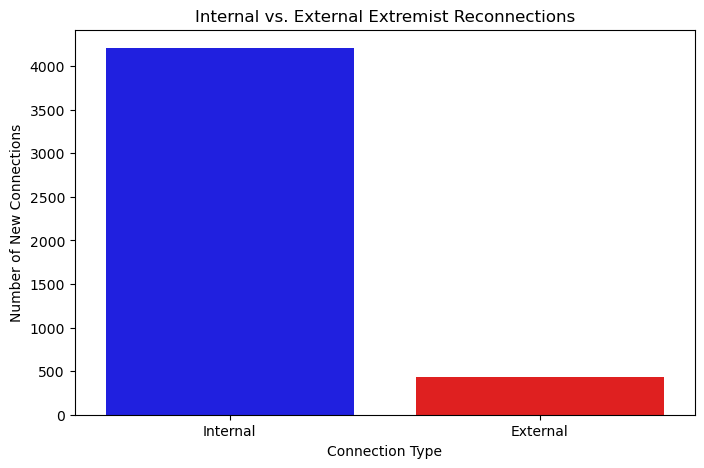


Analysis saved to 'internal_vs_external_connections.csv' and 'external_ideological_connections.csv'.


In [72]:
# -------------------------------
# Step 0: Filter Predictions Based on Jaccard Coefficient
# -------------------------------
# Calculate the average Jaccard coefficient
mean_jaccard = df_predictions["Jaccard Coefficient"].mean()
print("Average Jaccard Coefficient:", mean_jaccard)

# Filter the predictions to include only those with Jaccard Coefficient > average
df_predictions_filtered = df_predictions[df_predictions["Jaccard Coefficient"] > mean_jaccard]
print("Number of predictions above average Jaccard Coefficient:", len(df_predictions_filtered))

# Convert node IDs to strings to ensure proper merging
df_predictions_filtered["Node A"] = df_predictions_filtered["Node A"].astype(str)
df_predictions_filtered["Node B"] = df_predictions_filtered["Node B"].astype(str)
df_nodes["ID"] = df_nodes["ID"].astype(str)

# -------------------------------
# Step 1: Merge Filtered Predicted Connections with Node Ideology Data
# -------------------------------
# Merge with df_nodes for "Node A"
df_predictions_with_nodes = df_predictions_filtered.merge(
    df_nodes, left_on="Node A", right_on="ID", how="left"
)
# Merge with df_nodes for "Node B" (using suffixes to distinguish columns)
df_predictions_with_nodes = df_predictions_with_nodes.merge(
    df_nodes, left_on="Node B", right_on="ID", how="left", suffixes=("_A", "_B")
)

# -------------------------------
# Step 2: Label Connections as Internal or External
# -------------------------------
df_predictions_with_nodes["Connection Type"] = df_predictions_with_nodes.apply(
    lambda row: "Internal" if row["Ideology_A"] == row["Ideology_B"] else "External", axis=1
)

# -------------------------------
# Step 3: Count Internal vs. External Connections
# -------------------------------
connection_counts = df_predictions_with_nodes["Connection Type"].value_counts()

print("\nNew Extremist Connections Breakdown:")
print(connection_counts)

# -------------------------------
# Step 4: Identify Which Ideologies Are More Likely to Connect Externally
# -------------------------------
df_external_connections = df_predictions_with_nodes[df_predictions_with_nodes["Connection Type"] == "External"]
df_external_ideologies = df_external_connections.groupby(
    ["Ideology_A", "Ideology_B"]
).size().reset_index(name="External Connection Count")
df_external_ideologies = df_external_ideologies.sort_values(
    by="External Connection Count", ascending=False
)

print("\nTop 10 Most Common External Ideological Connections:")
print(df_external_ideologies.head(10))

# -------------------------------
# Step 5: Visualization - Internal vs. External
# -------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.barplot(x=connection_counts.index, y=connection_counts.values, palette=["blue", "red"])
plt.xlabel("Connection Type")
plt.ylabel("Number of New Connections")
plt.title("Internal vs. External Extremist Reconnections")
plt.show()

# -------------------------------
# Step 6: Save Results
# -------------------------------
df_predictions_with_nodes.to_csv("internal_vs_external_connections.csv", index=False)
df_external_ideologies.to_csv("external_ideological_connections.csv", index=False)

print("\nAnalysis saved to 'internal_vs_external_connections.csv' and 'external_ideological_connections.csv'.")


The difference arises because the "436 External" count refers to the number of connection rows (each row represents one connection between two nodes), whereas when you combine the ideology columns from both endpoints, you’re counting the ideologies of each node in the connection. In an ideal case (with no missing data), you would expect roughly 2 × 436 = 872 ideology entries. However, if some nodes didn’t have an ideology value (i.e. resulted in NaNs during the merge), those will be dropped from the value count, leading to a lower total.

In summary:

External Connection Count (436): This is the number of connections (each connection involves two nodes).
Ideology Value Count (~792): This counts the ideology entries from both endpoints. The difference (872 expected vs. 792 actual) suggests that some nodes are missing ideology information due to mismatches in the merge.

In [74]:
# -------------------------------
# Step X: Count Value of Ideologies in External Connections
# -------------------------------
# Filter for external connections (if not already done)
df_external_connections = df_predictions_with_nodes[df_predictions_with_nodes["Connection Type"] == "External"]

# Combine the ideology columns from both endpoints
external_ideologies = pd.concat([df_external_connections['Ideology_A'], df_external_connections['Ideology_B']])

# Count the frequency of each ideology
external_ideologies_counts = external_ideologies.value_counts()

print("Value counts of ideologies in external connections:")
print(external_ideologies_counts)


Value counts of ideologies in external connections:
Other                                        163
Black Nationalist/Separatist                 142
Anarchist/Anti-Capitalist                    121
Militia/Sovereign Citizen/Anti-Government    109
White Supremacist/Xenophobic                 107
Environmental/Animal Rights                   62
Conspiracy Theory                             51
Anti-Abortion                                 29
Jihadist                                       8
Name: count, dtype: int64


# Checking Most Frequent Individuals in External Connections

In [76]:
# **🔹 Step 1: Count How Many Times Each Bridge Node Appears in External Links**
df_bridge_counts = df_external_connections.melt(value_vars=["Node A", "Node B"], var_name="Role", value_name="Node")
df_bridge_counts = df_bridge_counts.groupby("Node").size().reset_index(name="Cross-Ideology Links")

# **🔹 Step 2: Rank by Most Frequent Cross-Ideology Connections**
df_bridge_counts = df_bridge_counts.sort_values(by="Cross-Ideology Links", ascending=False)

print("\nTop 10 Individuals Forming the Most Cross-Ideological Links:")
print(df_bridge_counts.head(10))



Top 10 Individuals Forming the Most Cross-Ideological Links:
      Node  Cross-Ideology Links
173   5508                    13
29   12110                    13
30   12111                    13
80    3847                    13
148   5110                    12
164   5193                    12
157   5137                    12
125   4800                    11
158   5140                    10
162   5145                    10


In [77]:
# **🔹 Step 1: Find Ideologies of Key Extremist Bridge Nodes**
print(df_nodes.columns)
df_bridge_ideologies = df_nodes[df_nodes["ID"].isin(['5508', '12210', '12111', '3847'])]

print("\nIdeology of Top Extremist Bridge Nodes:")
print(df_bridge_ideologies[["ID", "Ideology"]])

Index(['ID', 'Ideology', 'Decade', 'In_PIRUS'], dtype='object')

Ideology of Top Extremist Bridge Nodes:
         ID                      Ideology
1898   3847                 Anti-Abortion
2832   5508  Black Nationalist/Separatist
5137  12210                 Anti-Abortion


In [109]:
# merging with pirus to get the attributes of the persons 

In [79]:
# Convert both merge keys to string
df_nodes["ID"] = df_nodes["ID"].astype(str)
df_pirus["Subject_ID"] = df_pirus["Subject_ID"].astype(str)

In [80]:
# **🔹 Step 1: Define Relevant Radicalization Columns Based on Codebook**
radicalization_cols = [
    "Radicalization_Place", "Prison_Radicalize", "Internet_Radicalization",
    "Media_Radicalization", "Social_Media", "Social_Media_Frequency",
    "Radicalization_Islamist", "Radicalization_Far_Right", "Radicalization_Far_Left"
]

# **🔹 Step 2: Verify Available Columns in PIRUS V5**
available_radicalization_cols = [col for col in radicalization_cols if col in df_pirus.columns]

print("\nUsing the following columns as radicalization factors:")
print(available_radicalization_cols)

# **🔹 Step 3: Merge PIRUS Data with SoNAR Nodes using Subject_ID from df_pirus**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 4: Extract PIRUS Data for Key Bridge Nodes using Subject_ID**
df_bridge_pirus = df_nodes_pirus[df_nodes_pirus["Subject_ID"].isin(["1121", "1115"])]

print("\nPIRUS Attributes for Key Extremist Bridge Nodes (Subject_IDs 2057 & 10207):")
print(df_bridge_pirus[["Subject_ID", "Ideology", "Age", "Citizenship", "Education"] + available_radicalization_cols])

# **🔹 Step 5: Compare Radicalization Trends by Ideology**
df_risk_factors = df_nodes_pirus.groupby("Ideology")[["Age", "Education"] + available_radicalization_cols].agg(
    lambda x: x.mode()[0] if not x.isna().all() else "Unknown"
)

print("\nMost Common Demographics & Radicalization Methods by Ideology:")
print(df_risk_factors)

# **🔹 Step 1: Identify Criminal History Columns Based on Codebook**
criminal_cols = [
    "Previous_Criminal_Activity", "Previous_Criminal_Activity_Type",
    "Criminal_Severity", "Criminal_Charges", "Indict_Arrest"
]

# **🔹 Step 2: Verify Available Criminal History Columns**
available_criminal_cols = [col for col in criminal_cols if col in df_pirus.columns]

print("\nUsing the following columns for criminal history:")
print(available_criminal_cols)

# **🔹 Step 3: Merge PIRUS Data with SoNAR Nodes using Subject_ID from df_pirus**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 4: Extract PIRUS Data for Key Bridge Nodes using Subject_ID**
df_bridge_pirus = df_nodes_pirus[df_nodes_pirus["Subject_ID"].isin(["1121", "1115"])]

print("\nPIRUS Criminal History for Key Extremist Bridge Nodes (Subject_IDs 2057 & 10207):")
print(df_bridge_pirus[["Subject_ID", "Ideology"] + available_criminal_cols])

# **🔹 Step 5: Compare Criminal Patterns Across Extremist Ideologies**
df_criminal_patterns = df_nodes_pirus.groupby("Ideology")[available_criminal_cols].agg(
    lambda x: x.mode()[0] if not x.isna().all() else "Unknown"
)

print("\nMost Common Criminal Backgrounds by Ideology:")
print(df_criminal_patterns)

# **🔹 Step 6: Save Integrated Data**
df_nodes_pirus.to_csv("pirus_sonar_combined.csv", index=False)
df_criminal_patterns.to_csv("criminal_patterns_by_ideology.csv", index=False)

print("\nMerged dataset saved successfully.")

# **🔹 Step 7: Save Integrated Data**
df_nodes_pirus.to_csv("pirus_sonar_combined.csv", index=False)
df_risk_factors.to_csv("ideology_risk_factors.csv", index=False)

print("\nMerged dataset saved successfully.")



Using the following columns as radicalization factors:
['Radicalization_Place', 'Prison_Radicalize', 'Internet_Radicalization', 'Media_Radicalization', 'Social_Media', 'Social_Media_Frequency', 'Radicalization_Islamist', 'Radicalization_Far_Right', 'Radicalization_Far_Left']

PIRUS Attributes for Key Extremist Bridge Nodes (Subject_IDs 2057 & 10207):
     Subject_ID  Ideology   Age Citizenship  Education Radicalization_Place  \
999        1115  Jihadist  24.0     Somalia        3.0                  -99   
1005       1121  Jihadist  18.0     Somalia        2.0                    1   

      Prison_Radicalize  Internet_Radicalization  Media_Radicalization  \
999               -99.0                    -99.0                 -99.0   
1005              -88.0                    -99.0                 -99.0   

      Social_Media  Social_Media_Frequency  Radicalization_Islamist  \
999          -99.0                   -99.0                      1.0   
1005           0.0                   -88.0 

# In the above code we are seeing the attributes or the characteristics of the individuals 1115 and 1121 who were recognized as the key recruiters in the rmoved graph or data base 

# Bipartite network

## General


Bipartite Network Created: 5444 nodes, 9535 edges.

Projected Network of Extremists (based on Ideology): 5413 nodes, 4193509 edges.

Projected Network of Extremists (based on Plots): 5413 nodes, 3873057 edges.


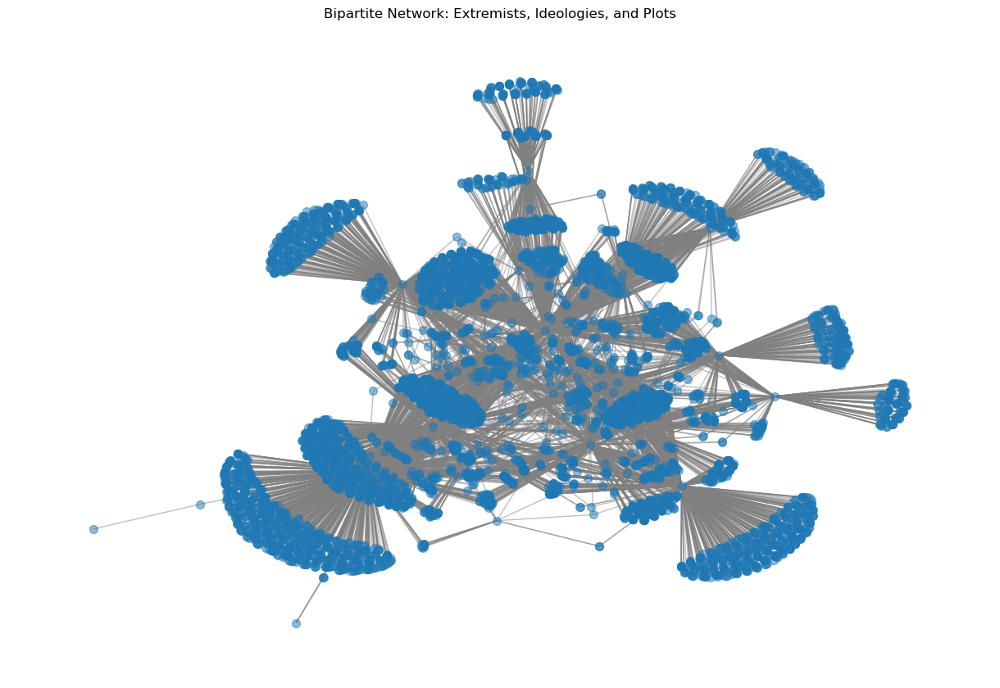


Bipartite network data saved successfully.


In [83]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from networkx.algorithms import bipartite



# Ensure IDs are in the correct format
df_pirus["Subject_ID"] = df_pirus["Subject_ID"].astype(str)
df_nodes["ID"] = df_nodes["ID"].astype(str)

# **🔹 Step 2: Merge PIRUS Data with SoNAR Nodes**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 3: Extract Extremists, Ideologies, and Plots**
bipartite_ideology_edges = df_nodes_pirus[["ID", "Ideology"]].dropna()

# Extract Plots (Individuals → Plot Targets)
plot_columns = ["Plot_Target1", "Plot_Target2", "Plot_Target3"]
df_nodes_pirus_melted = df_nodes_pirus.melt(id_vars=["ID"], value_vars=plot_columns, var_name="Plot_Type", value_name="Plot_Target")
bipartite_plot_edges = df_nodes_pirus_melted[["ID", "Plot_Target"]].dropna()

# **🔹 Step 4: Build the Three-Layer Bipartite Graph**
B = nx.Graph()

# Add individuals (Layer 1)
B.add_nodes_from(bipartite_ideology_edges["ID"], bipartite=0)

# Add ideologies (Layer 2)
B.add_nodes_from(bipartite_ideology_edges["Ideology"], bipartite=1)

# Add plots (Layer 3)
B.add_nodes_from(bipartite_plot_edges["Plot_Target"], bipartite=2)

# Add edges between individuals and their extremist ideology
for _, row in bipartite_ideology_edges.iterrows():
    B.add_edge(row["ID"], row["Ideology"])

# Add edges between individuals and the plots they were involved in
for _, row in bipartite_plot_edges.iterrows():
    B.add_edge(row["ID"], row["Plot_Target"])

print(f"\nBipartite Network Created: {len(B.nodes())} nodes, {len(B.edges())} edges.")

# **🔹 Step 5: Project the Bipartite Network onto a One-Mode Graph**
G_projection_ideology = bipartite.weighted_projected_graph(B, list(bipartite_ideology_edges["ID"]))
G_projection_plots = bipartite.weighted_projected_graph(B, list(bipartite_plot_edges["ID"]))

print(f"\nProjected Network of Extremists (based on Ideology): {len(G_projection_ideology.nodes())} nodes, {len(G_projection_ideology.edges())} edges.")
print(f"\nProjected Network of Extremists (based on Plots): {len(G_projection_plots.nodes())} nodes, {len(G_projection_plots.edges())} edges.")

# **🔹 Step 6: Visualize the Bipartite Network**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(B, seed=42)
nx.draw(B, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False)
plt.title("Bipartite Network: Extremists, Ideologies, and Plots")
plt.show()

# **🔹 Step 7: Save the Bipartite Network Data**
nx.write_edgelist(B, "bipartite_network_with_plots.edgelist")
nx.write_edgelist(G_projection_ideology, "projected_extremist_network_ideology.edgelist")
nx.write_edgelist(G_projection_plots, "projected_extremist_network_plots.edgelist")

print("\nBipartite network data saved successfully.")


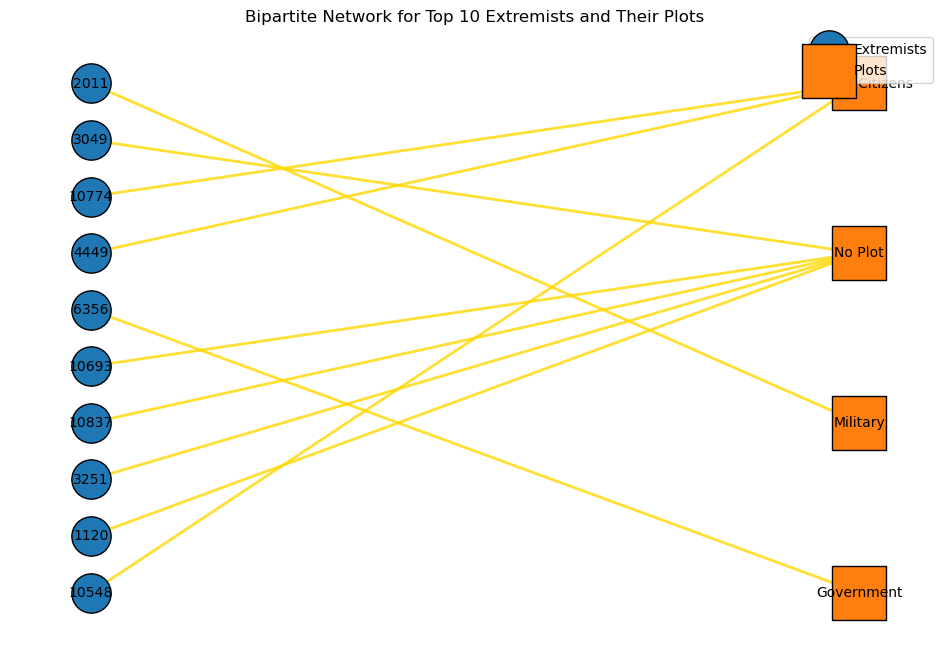

In [84]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# ------------- Existing Steps -------------
# (We assume df_nodes_pirus is defined and contains "ID", "Plot_Target1", and "Ideology")

# Build the full bipartite graph using "Plot_Target1"
G_bipartite = nx.Graph()

# Add extremist nodes (bipartite attribute 0)
extremists = set(df_nodes_pirus["ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plot nodes (bipartite attribute 1)
plots = set(df_nodes_pirus["Plot_Target1"].dropna())
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges between extremists and plots
for _, row in df_nodes_pirus.iterrows():
    if pd.notnull(row["Plot_Target1"]):
        G_bipartite.add_edge(row["ID"], row["Plot_Target1"])

# Map plot numbers to descriptive names (optional, for later labeling)
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}
df_nodes_pirus["Plot_Name"] = df_nodes_pirus["Plot_Target1"].map(plot_target_map)

# Assign ideology to extremist nodes
ideology_mapping = dict(zip(df_nodes_pirus["ID"], df_nodes_pirus["Ideology"]))
for node, data in G_bipartite.nodes(data=True):
    if data.get("bipartite") == 0:
        G_bipartite.nodes[node]["ideology"] = ideology_mapping.get(node, "Unknown")

# ------------- New Code: Plotting Top 10 Extremists -------------

# Select top 10 extremists by degree in the bipartite network
extremist_degrees = G_bipartite.degree(extremists)
# Sort extremists by degree (highest first) and take top 10
top_extremists = sorted(extremists, key=lambda n: G_bipartite.degree(n), reverse=True)[:10]

# Create a subgraph including the top 10 extremists and all plots they are connected to
nodes_to_include = set(top_extremists)
for n in top_extremists:
    nodes_to_include.update(G_bipartite.neighbors(n))
G_sub = G_bipartite.subgraph(nodes_to_include)

# For layout, we'll use the bipartite layout
# The bipartite layout requires the set of nodes in one partition, here the extremists.
pos = nx.bipartite_layout(G_sub, top_extremists)

# Define colors and shapes:
extremist_color = "#1f78b4"  # a coherent blue for extremists
plot_color = "#ff7f0e"       # a coherent orange for plot nodes
edge_color = "#FFD700"       # golden color for edges

# Separate nodes by type from the subgraph
sub_extremists = [n for n, d in G_sub.nodes(data=True) if d.get("bipartite") == 0]
sub_plots = [n for n, d in G_sub.nodes(data=True) if d.get("bipartite") == 1]

plt.figure(figsize=(12, 8))
# Draw extremist nodes as circles
nx.draw_networkx_nodes(G_sub, pos, nodelist=sub_extremists, node_color=extremist_color,
                       node_shape='o', node_size=800, edgecolors="black", label="Extremists")
# Draw plot nodes as squares
nx.draw_networkx_nodes(G_sub, pos, nodelist=sub_plots, node_color=plot_color,
                       node_shape='s', node_size=1500, edgecolors="black", label="Plots")
# Draw edges in golden color
nx.draw_networkx_edges(G_sub, pos, edge_color=edge_color, width=2, alpha=0.8)

# Optionally, add labels: use extremist IDs and for plots use descriptive names if available.
labels = {}
for n in sub_extremists:
    labels[n] = str(n)
for n in sub_plots:
    # Use the descriptive name if available; fallback to the node id
    labels[n] = df_nodes_pirus[df_nodes_pirus["Plot_Target1"] == n]["Plot_Name"].iloc[0] if not df_nodes_pirus[df_nodes_pirus["Plot_Target1"] == n].empty else str(n)

nx.draw_networkx_labels(G_sub, pos, labels, font_size=10)

plt.legend(scatterpoints=1)
plt.title("Bipartite Network for Top 10 Extremists and Their Plots")
plt.axis('off')
plt.show()


In [85]:
import networkx as nx
import pandas as pd
from collections import defaultdict

# ================================
# STEP 1: Build the Bipartite Network from df_nodes_pirus
# ================================
# We assume df_nodes_pirus has these columns:
# "ID" (extremist identifier), "Plot_Target1" (plot identifier), and "Ideology".

# Create an empty bipartite graph
G_bipartite = nx.Graph()

# Add extremist nodes (bipartite attribute 0)
extremists = set(df_nodes_pirus["ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plot nodes (bipartite attribute 1) using the "Plot_Target1" column
plots = set(df_nodes_pirus["Plot_Target1"].dropna())
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges between extremists and plots
for _, row in df_nodes_pirus.iterrows():
    if pd.notnull(row["Plot_Target1"]):
        G_bipartite.add_edge(row["ID"], row["Plot_Target1"])

# ================================
# STEP 2: Map Plot Numbers to Descriptive Names
# ================================
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}

# Add a descriptive column in the DataFrame (optional)
df_nodes_pirus["Plot_Name"] = df_nodes_pirus["Plot_Target1"].map(plot_target_map)

# ================================
# STEP 3: Assign Ideology to Each Extremist Node
# ================================
# Create a mapping from extremist ID to their ideology.
ideology_mapping = dict(zip(df_nodes_pirus["ID"], df_nodes_pirus["Ideology"]))

# Add an "ideology" attribute to each extremist node (bipartite attribute 0)
for node, data in G_bipartite.nodes(data=True):
    if data.get("bipartite") == 0:
        G_bipartite.nodes[node]["ideology"] = ideology_mapping.get(node, "Unknown")

# ================================
# STEP 4: Determine Ideology Composition for Each Plot
# ================================
# For each plot, gather:
#   - The set of ideologies among connected extremists.
#   - The number of extremists connected to that plot.
plot_ideology_info = {}
plot_extremist_counts = {}

for plot in plots:
    # Get extremist neighbors for the plot
    extremist_neighbors = list(G_bipartite.neighbors(plot))
    # Count the number of extremists connected to this plot
    plot_extremist_counts[plot] = len(extremist_neighbors)
    # Collect their ideologies
    ideologies = set(G_bipartite.nodes[ext]["ideology"] for ext in extremist_neighbors)
    plot_ideology_info[plot] = ideologies

# Create a DataFrame to display the ideology composition and counts per plot
df_plot_info = pd.DataFrame([
    {
        "Plot": plot,
        "Plot_Description": plot_target_map.get(int(plot), str(plot)) if str(plot).isdigit() else str(plot),
        "Num_Extremists": plot_extremist_counts[plot],
        "Ideologies": plot_ideology_info[plot]
    }
    for plot in plot_extremist_counts
], columns=["Plot", "Plot_Description", "Num_Extremists", "Ideologies"])

# Sort the DataFrame by the number of extremists (descending) and take the top 10
df_top10_plots = df_plot_info.sort_values(by="Num_Extremists", ascending=False).head(10)

print("Top 10 Plots with the Most Extremists and Their Ideology Composition:")
print(df_top10_plots.to_string(index=False))


Top 10 Plots with the Most Extremists and Their Ideology Composition:
Plot       Plot_Description  Num_Extremists                                                                                                                                                                                                         Ideologies
 -88                    -88            1648 {Environmental/Animal Rights, Anti-Abortion, White Supremacist/Xenophobic, Jihadist, Militia/Sovereign Citizen/Anti-Government, Anarchist/Anti-Capitalist, Other, Black Nationalist/Separatist, Conspiracy Theory}
  14       Private Citizens             730 {Environmental/Animal Rights, Anti-Abortion, White Supremacist/Xenophobic, Jihadist, Anarchist/Anti-Capitalist, Militia/Sovereign Citizen/Anti-Government, Conspiracy Theory, Other, Black Nationalist/Separatist}
   2             Government             447                              {Anti-Abortion, Jihadist, White Supremacist/Xenophobic, Militia/Sovereign Citizen/Anti-Gover

📌 Key Observations
1️⃣ Most Frequently Targeted Plot Categories
No Specific Target (-88):

1648 extremists are categorized under no specific plot (-88).
This suggests ambiguous, failed, or generalized threats rather than targeted attacks.
The wide range of ideologies in this category indicates potential lone actors or decentralized cells.
Private Citizens (14) – 730 extremists:

This is the most frequently targeted identifiable group.
Nearly all extremist ideologies are represented.
Attacks on civilians are often symbolic, high-impact, and media-driven.
Government (2) – 447 extremists:

Common across multiple extremist groups, including:
Jihadists, Anti-Government Militias, Conspiracy Theorists, and White Supremacists.
This suggests anti-establishment motivations across ideologies.
Police (3) – 207 extremists:

Law enforcement is often seen as an immediate threat to extremist groups.
Presence of Anarchists, Anti-Government Militias, and Conspiracy Theorists suggests clashes with state authority.
Businesses (1) – 143 extremists:

Targets include corporate offices, economic hubs, and industries.
Presence of Environmental/Animal Rights groups indicates a focus on economic sabotage.

2️⃣ Target-Specific Ideological Trends
Jihadists & Anti-Government Militias dominate across multiple plot types.
Anti-Abortion extremists specifically target Abortion-Related Institutions (5).
White Supremacists appear in almost every major attack category.
Environmental/Animal Rights groups mainly focus on Businesses (1).
3️⃣ Overlap of Extremist Ideologies
The same target categories are attacked by multiple extremist ideologies.
Private Citizens, Government, and Police are the most ideological diverse targets.
This suggests that while extremists have different motivations, they perceive common enemies.

📊 Actionable Insights
✅ Network Evolution Analysis

Track whether extremist groups shift their targeting strategies over time.
✅ Law Enforcement Implications

Prioritize Private Citizen & Government protection as they are the most frequent targets.
✅ Emerging Threats Analysis

Identify ideological alliances or hybrid extremism by analyzing co-targeting trends.
